In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
from dataprep.eda import create_report, plot, plot_correlation, plot_missing , plot_diff
import seaborn as sns
import numpy as np
import jinja2

In [2]:
df = pd.read_csv('train.csv', index_col='id')
df_new = pd.read_csv('ConcreteStrengthData.csv')
df_new.rename(columns={'CementComponent ': 'CementComponent'}, inplace=True)
df.shape, df_new.shape

((5407, 9), (1030, 9))

In [3]:
df_final = pd.concat([df,df_new],ignore_index=True)
df_final.shape

(6437, 9)

In [4]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6437 entries, 0 to 6436
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   CementComponent            6437 non-null   float64
 1   BlastFurnaceSlag           6437 non-null   float64
 2   FlyAshComponent            6437 non-null   float64
 3   WaterComponent             6437 non-null   float64
 4   SuperplasticizerComponent  6437 non-null   float64
 5   CoarseAggregateComponent   6437 non-null   float64
 6   FineAggregateComponent     6437 non-null   float64
 7   AgeInDays                  6437 non-null   int64  
 8   Strength                   6437 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 452.7 KB


In [5]:
df_final.isnull().values.any()

False

In [6]:
df1 = df_final.copy(deep=True)
df1.shape

(6437, 9)

In [7]:
df1['Water_Cement'] = df1['WaterComponent']/df1['CementComponent']
df1['Coarse_Fine'] = df1['CoarseAggregateComponent']/df1['FineAggregateComponent']
df1['Aggregate'] = df1['CoarseAggregateComponent'] + df1['FineAggregateComponent']
df1['Aggregate_Cement'] = df1['Aggregate']/df1['CementComponent']
df1['Slag_Cement'] = df1['BlastFurnaceSlag']/df1['CementComponent']
df1['Ash_Cement'] = df1['FlyAshComponent']/df1['CementComponent']
df1['Plastic_Cement'] = df1['SuperplasticizerComponent']/df1['CementComponent']
df1['Age_Water'] = df1['AgeInDays']/df1['WaterComponent']

In [9]:
df1.shape

(6437, 17)

  0%|          | 0/3568 [00:00<?, ?it/s]

c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\dask\core.py:119: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))



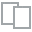
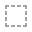
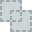
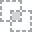
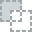
...
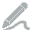
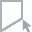
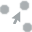
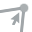
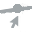

In [8]:
report = create_report(df1)
report.show()


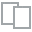
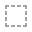
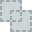
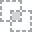
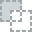
...
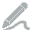
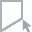
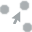
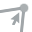
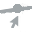

In [10]:
plot_correlation(df1)

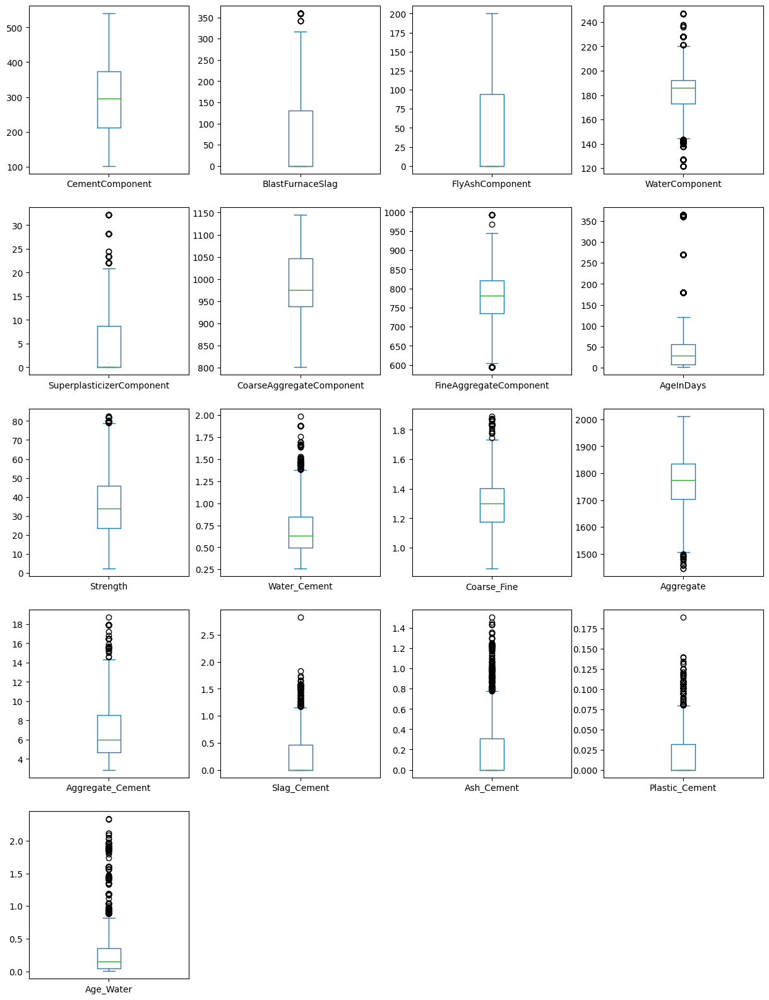

In [87]:
df1.plot(kind = "box",subplots = True,layout = (5,4),figsize=(15,20)) #Boxplot to check the outliers
plt.show()

In [11]:
import lightgbm as lgb
import xgboost as xgb
import optuna
import optuna.integration.lightgbm as lgbo


class config:
    OPTUNA_SWITCH = "on"
    OBJECTIVE = "regression"
    METRIC = "rmse"
    TEST_SIZE = 0.2

In [12]:
X = df1.drop(['Strength'],axis=1)
y = df1.Strength

X.shape, y.shape

((6437, 16), (6437,))

In [13]:
# create X and Y datasets for training
from sklearn import model_selection
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, random_state=42, test_size = 0.2)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((5149, 16), (1288, 16), (5149,), (1288,))

In [18]:
from sklearn.preprocessing import MinMaxScaler

cols = X_train.columns
scaler = MinMaxScaler()
X_train_RF = scaler.fit_transform(X_train)
X_test_RF = scaler.transform(X_test)

X_train_RF = pd.DataFrame(X_train_RF,columns=cols)
X_test_RF = pd.DataFrame(X_test_RF,columns=cols)

In [14]:
from sklearn.linear_model import LinearRegression

# initialize the linear regression model
reg = LinearRegression()

# Train the model with our training data
reg.fit(X_train, y_train)

LinearRegression()

In [15]:
y_pred_lin = reg.predict(X_test)

In [16]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_ln = mean_absolute_error(y_test,y_pred_lin)
rmse_ln = sqrt(mean_squared_error(y_test,y_pred_lin))
r_sq_ln = r2_score(y_test,y_pred_lin)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_ln,3),round(rmse_ln,3),round(r_sq_ln,3)))

Mean Absolute Error: 10.789
Root Mean Square Error: 14.014
R2 Score: 0.253


RF

In [17]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=10)
rf.fit(X_train,y_train)

RandomForestRegressor(n_estimators=10)

In [18]:
y_pred_RF = rf.predict(X_test)

In [19]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_rf = mean_absolute_error(y_test,y_pred_RF)
rmse_rf = sqrt(mean_squared_error(y_test,y_pred_RF))
r_sq_rf = r2_score(y_test,y_pred_RF)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_rf,3),round(rmse_rf,3),round(r_sq_rf,3)))

Mean Absolute Error: 9.526
Root Mean Square Error: 12.456
R2 Score: 0.409


With 100 trees

In [20]:
from sklearn.ensemble import RandomForestRegressor

rf = RandomForestRegressor(n_estimators=100)
rf.fit(X_train,y_train)
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [21]:
y_pred_RF_100 = rf.predict(X_test)
# print(y_pred_RF_100)

In [22]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_rf100 = mean_absolute_error(y_test,y_pred_RF_100)
rmse_rf100 = sqrt(mean_squared_error(y_test,y_pred_RF_100))
r_sq_rf100 = r2_score(y_test,y_pred_RF_100)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_rf100,3),round(rmse_rf100,3),round(r_sq_rf100,3)))

Mean Absolute Error: 9.33
Root Mean Square Error: 12.258
R2 Score: 0.428


RF CV

In [23]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np
parameters = {
    'n_estimators': [100, 150, 200, 250, 300,500,1000],
    'max_depth': [10, 20, None],
    'bootstrap':[True],
    'min_samples_leaf': [1,2,4],
    'min_samples_split': [2,5,10]
}
regr = RandomForestRegressor(random_state=12)

clf = GridSearchCV(regr, parameters,verbose=10,n_jobs=6,cv=3)
clf.fit(X_train, y_train)
print("Best params: ", clf.best_params_)

Fitting 3 folds for each of 189 candidates, totalling 567 fits
Best params:  {'bootstrap': True, 'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10, 'n_estimators': 1000}


In [26]:
y_pred_RF_cv = clf.predict(X_test)
# print(y_pred_RF_100)

In [27]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_rfcv = mean_absolute_error(y_test,y_pred_RF_cv)
rmse_rfcv = sqrt(mean_squared_error(y_test,y_pred_RF_cv))
r_sq_rfcv = r2_score(y_test,y_pred_RF_cv)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_rfcv,3),round(rmse_rfcv,3),round(r_sq_rfcv,3)))

Mean Absolute Error: 8.983
Root Mean Square Error: 11.715
R2 Score: 0.478


ANN

In [45]:
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
# Importing libraries for building the neural network
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import StratifiedKFold, cross_val_score, KFold, train_test_split
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, TensorBoard
from keras.optimizers import SGD, Adam, Adadelta, RMSprop
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import tensorflow as tf

In [46]:
concrete_model = Sequential()
concrete_model.add(Dense(256, input_shape = (X_train.shape[1],), activation = "relu"))
concrete_model.add(Dense(512, activation = "relu"))
concrete_model.add(Dense(1024, activation = "relu"))
concrete_model.add(Dropout(0.2))
concrete_model.add(Dense(1024, activation = "relu"))
concrete_model.add(Dense(512, activation = "relu"))
concrete_model.add(Dense(256, activation = "relu"))
concrete_model.add(Flatten())
concrete_model.add(Dense(512, activation = "relu"))
concrete_model.add(Dropout(0.5))
concrete_model.add(Dense(512, activation = "relu"))
concrete_model.add(Dropout(0.5))
concrete_model.add(Dense(1, activation = "linear",kernel_regularizer = tf.keras.regularizers.l1(l=0.001)))
concrete_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_9 (Dense)             (None, 256)               4352      
                                                                 
 dense_10 (Dense)            (None, 512)               131584    
                                                                 
 dense_11 (Dense)            (None, 1024)              525312    
                                                                 
 dropout_3 (Dropout)         (None, 1024)              0         
                                                                 
 dense_12 (Dense)            (None, 1024)              1049600   
                                                                 
 dense_13 (Dense)            (None, 512)               524800    
                                                                 
 dense_14 (Dense)            (None, 256)              

In [47]:
optimizer=Adam(learning_rate=0.001, beta_1=0.9, beta_2=0.999)

# Compile the network :
concrete_model.compile(optimizer=optimizer, loss=tf.keras.losses.MAE, metrics=[tf.keras.metrics.MAE])

In [48]:
m_loss = EarlyStopping(
    monitor="val_loss",
    min_delta=0,
    patience=20,
    verbose=1,
    mode="auto",
    baseline=None,
    restore_best_weights=True,
)

In [49]:
save_checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath='concrete_model.h5', monitor='val_loss', save_best_only=True, verbose=1)

In [50]:
history=concrete_model.fit(X_train, y_train, epochs=100,validation_data= (X_test, y_test), batch_size=128, verbose=1,callbacks=[m_loss,save_checkpoint])

Epoch 1/100
34/41 [=======================>......] - ETA: 0s - loss: 20.9452 - mean_absolute_error: 20.9188
Epoch 1: val_loss improved from inf to 12.52474, saving model to concrete_model.h5
41/41 [==============================] - 1s 13ms/step - loss: 20.0577 - mean_absolute_error: 20.0313 - val_loss: 12.5247 - val_mean_absolute_error: 12.4988
Epoch 2/100
37/41 [==========================>...] - ETA: 0s - loss: 13.2645 - mean_absolute_error: 13.2386
Epoch 2: val_loss did not improve from 12.52474
41/41 [==============================] - 0s 4ms/step - loss: 13.1553 - mean_absolute_error: 13.1294 - val_loss: 13.1479 - val_mean_absolute_error: 13.1221
Epoch 3/100
22/41 [===============>..............] - ETA: 0s - loss: 13.3848 - mean_absolute_error: 13.3591
Epoch 3: val_loss improved from 12.52474 to 11.76390, saving model to concrete_model.h5
41/41 [==============================] - 0s 5ms/step - loss: 12.9859 - mean_absolute_error: 12.9602 - val_loss: 11.7639 - val_mean_absolute_error:

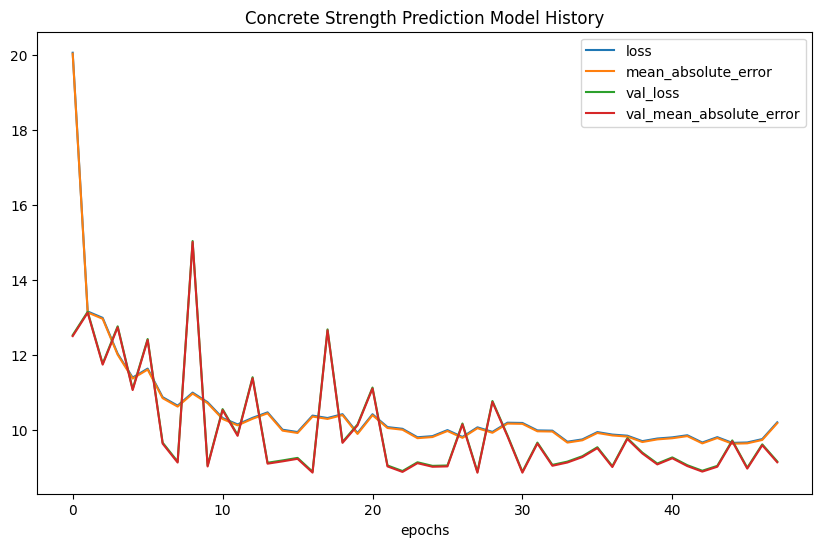

In [51]:
dfh = pd.DataFrame(history.history)
plt.figure(figsize=(10, 6))
plt.title('Concrete Strength Prediction Model History')
plt.plot(dfh)
plt.xlabel('epochs')
plt.legend(dfh.columns)
plt.show()

In [52]:
y_pred_cnn = concrete_model.predict(X_test)
# print(y_pred_cnn)

41/41 [==============================] - 0s 2ms/step


In [53]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_cnn = mean_absolute_error(y_test,y_pred_cnn)
rmse_cnn = sqrt(mean_squared_error(y_test,y_pred_cnn))
r_sq_cnn = r2_score(y_test,y_pred_cnn)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_cnn,3),round(rmse_cnn,3),round(r_sq_cnn,3)))

Mean Absolute Error: 8.855
Root Mean Square Error: 11.74
R2 Score: 0.475


lgbm

In [54]:
def tune_parameters_lgbm(X_train , y_train):
    opt_params = {
        "objective" : config.OBJECTIVE,
        "metric" : config.METRIC
    }

    reg_train = lgb.Dataset(
        X_train , 
        y_train
    )
    
    reg_eval = lgb.Dataset(
        X_test , 
        y_test,
        reference = reg_train
    )
    
    opt = lgbo.train(
        opt_params,
        reg_train,
        valid_sets = reg_eval ,
        verbose_eval = False,
        num_boost_round = 200,
        early_stopping_rounds = 100
    )
    
    return opt
if config.OPTUNA_SWITCH == "on":
    opt = tune_parameters_lgbm(X_train , y_train)  

[I 2023-03-09 14:06:19,474] A new study created in memory with name: no-name-98435ecc-74f0-4da6-ae99-4c74ee443323
feature_fraction, val_score: inf:   0%|          | 0/7 [00:00<?, ?it/s]c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\engine.py:181: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "
c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000584 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


feature_fraction, val_score: 11.529119:  29%|##8       | 2/7 [00:00<00:01,  4.83it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


feature_fraction, val_score: 11.529119:  57%|#####7    | 4/7 [00:00<00:00,  5.39it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


feature_fraction, val_score: 11.529119:  86%|########5 | 6/7 [00:01<00:00,  5.69it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000321 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000402 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.529119:   0%|          | 0/20 [00:00<?, ?it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

num_leaves, val_score: 11.529119:   5%|5         | 1/20 [00:00<00:10,  1.89it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 11.529119:  10%|#         | 2/20 [00:00<00:07,  2.53it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000316 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.529119:  15%|#5        | 3/20 [00:01<00:06,  2.48it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000347 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.529119:  20%|##        | 4/20 [00:01<00:06,  2.36it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.529119:  25%|##5       | 5/20 [00:02<00:06,  2.29it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.529119:  30%|###       | 6/20 [00:02<00:05,  2.38it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

num_leaves, val_score: 11.529119:  35%|###5      | 7/20 [00:03<00:06,  2.11it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 11.529119:  40%|####      | 8/20 [00:03<00:05,  2.05it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000383 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the trai

num_leaves, val_score: 11.529119:  45%|####5     | 9/20 [00:04<00:05,  1.98it/s]

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

num_leaves, val_score: 11.483504:  60%|######    | 12/20 [00:04<00:02,  3.39it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000424 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000309 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the 

num_leaves, val_score: 11.475158:  70%|#######   | 14/20 [00:04<00:01,  4.90it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000686 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000361 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.475158:  75%|#######5  | 15/20 [00:05<00:01,  4.87it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000435 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.475158:  80%|########  | 16/20 [00:05<00:00,  4.75it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000339 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.475158:  90%|######### | 18/20 [00:05<00:00,  4.80it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000838 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


num_leaves, val_score: 11.475158: 100%|##########| 20/20 [00:05<00:00,  3.37it/s]


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000343 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.475158:   0%|          | 0/10 [00:00<?, ?it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000376 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.435531:  20%|##        | 2/10 [00:00<00:00, 14.23it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000352 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


[I 2023-03-09 14:06:26,891] Trial 29 finished with value: 11.459649492922287 and parameters: {'bagging_fraction': 0.910173199772864, 'bagging_freq': 7}. Best is trial 28 with value: 11.43553139140896.
bagging, val_score: 11.435531:  30%|###       | 3/10 [00:00<00:00, 14.23it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.435531:  50%|#####     | 5/10 [00:00<00:00, 14.18it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000915 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.435531:  60%|######    | 6/10 [00:00<00:00, 13.92it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000393 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.435531:  80%|########  | 8/10 [00:00<00:00, 13.99it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000414 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


bagging, val_score: 11.435531:  90%|######### | 9/10 [00:00<00:00, 13.99it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000368 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


feature_fraction_stage2, val_score: 11.435531:  17%|#6        | 1/6 [00:00<00:00, 13.43it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000391 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


feature_fraction_stage2, val_score: 11.435531:  67%|######6   | 4/6 [00:00<00:00, 12.29it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] S

[I 2023-03-09 14:06:27,801] Trial 41 finished with value: 11.458601234943048 and parameters: {'feature_fraction': 0.62}. Best is trial 38 with value: 11.43553139140896.
feature_fraction_stage2, val_score: 11.435531: 100%|##########| 6/6 [00:00<00:00, 12.67it/s]


[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000341 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435531:   5%|5         | 1/20 [00:00<00:01, 13.90it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000356 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000332 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435531:  10%|#         | 2/20 [00:00<00:01, 14.93it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000345 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  20%|##        | 4/20 [00:00<00:01, 14.05it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000340 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001803 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  25%|##5       | 5/20 [00:00<00:01, 14.05it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  35%|###5      | 7/20 [00:00<00:00, 13.02it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000390 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  40%|####      | 8/20 [00:00<00:00, 13.64it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000329 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  50%|#####     | 10/20 [00:00<00:00, 13.34it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  55%|#####5    | 11/20 [00:00<00:00, 13.34it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000492 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  60%|######    | 12/20 [00:00<00:00, 12.88it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000334 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  65%|######5   | 13/20 [00:01<00:00, 12.88it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000371 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  75%|#######5  | 15/20 [00:01<00:00, 11.40it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000374 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  80%|########  | 16/20 [00:01<00:00, 11.56it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000354 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  90%|######### | 18/20 [00:01<00:00, 11.79it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000363 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000355 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


regularization_factors, val_score: 11.435526:  95%|#########5| 19/20 [00:01<00:00, 11.79it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000392 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


min_data_in_leaf, val_score: 11.435526:  20%|##        | 1/5 [00:00<00:00, 13.06it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000400 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


min_data_in_leaf, val_score: 11.435526:  40%|####      | 2/5 [00:00<00:00, 13.33it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000349 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


min_data_in_leaf, val_score: 11.435526:  80%|########  | 4/5 [00:00<00:00, 13.99it/s]

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000324 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3164
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.554640


[I 2023-03-09 14:06:29,846] Trial 67 finished with value: 11.476639050721335 and parameters: {'min_child_samples': 100}. Best is trial 66 with value: 11.461266084171717.
min_data_in_leaf, val_score: 11.435526: 100%|##########| 5/5 [00:00<00:00, 14.20it/s]


In [57]:
print("Best Parameter For LGBM is")
print(opt.params)
best_params_lgbm = opt.params

Best Parameter For LGBM is
{'objective': 'regression', 'metric': 'rmse', 'feature_pre_filter': False, 'lambda_l1': 1.129780714713823e-07, 'lambda_l2': 0.02690649764116875, 'num_leaves': 7, 'feature_fraction': 0.7, 'bagging_fraction': 0.9537075756080055, 'bagging_freq': 5, 'min_child_samples': 20, 'num_iterations': 200, 'early_stopping_round': 100}


In [58]:
y_test.shape

(1288,)

In [106]:
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=config.TEST_SIZE, random_state=0)

lgb_train = lgb.Dataset(X_train, y_train)
lgb_eval = lgb.Dataset(X_test, y_test, reference=lgb_train)
evaluation_results = {}                       
model_lgbm = lgb.train(
    best_params_lgbm,
    valid_names=['train', 'valid'],           
    valid_sets=[lgb_train, lgb_eval],        
    evals_result=evaluation_results,          
    train_set=lgb_train
)

[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000346 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 3179
[LightGBM] [Info] Number of data points in the train set: 5149, number of used features: 16
[LightGBM] [Info] Start training from score 35.642626
[1]	train's rmse: 15.8425	valid's rmse: 15.358
Training until validation scores don't improve for 100 rounds
[2]	train's rmse: 15.2459	valid's rmse: 14.7497
[3]	train's rmse: 14.7404	valid's rmse: 14.2464
[4]	train's rmse: 14.3062	valid's rmse: 13.8165
[5]	train's rmse: 13.9355	valid's rmse: 13.4434
[6]	train's rmse: 13.6225	valid's rmse: 13.1305
[7]	train's rmse: 13.3578	valid's rmse: 12.8585
[8]	train's rmse: 13.122	valid's rmse: 12.6311
[9]	train's rmse: 12.9218	valid's rmse: 12.4427
[10]	train's rmse: 12.7548	valid's rmse: 12.2764
[11]	train's rmse: 12.6109	valid's rmse: 12.1375
[12]	train's rmse: 12.4905	valid's rmse: 12.0236
[13]	train's rms

c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\engine.py:260: UserWarning: 'evals_result' argument is deprecated and will be removed in a future release of LightGBM. Pass 'record_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'evals_result' argument is deprecated and will be removed in a future release of LightGBM. "


In [107]:
y_pred_lgbm = model_lgbm.predict(X_test)

In [108]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_lgbm = mean_absolute_error(y_test,y_pred_lgbm)
rmse_lgbm = sqrt(mean_squared_error(y_test,y_pred_lgbm))
r_sq_lgbm = r2_score(y_test,y_pred_lgbm)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_lgbm,3),round(rmse_lgbm,3),round(r_sq_lgbm,3)))

Mean Absolute Error: 8.694
Root Mean Square Error: 11.223
R2 Score: 0.512


XGB

In [127]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# can change the range to get better results
def objective(trial):
    # Define the hyperparameters to optimize
    param = {
        'objective': 'reg:squarederror',
        'eval_metric': 'rmse',
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 1e2, log=True),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.3, log=True),
        'n_estimators': trial.suggest_int('n_estimators', 50, 500, step=15),
        'lambda': trial.suggest_float('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_float('alpha', 1e-8, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 12),
        'eta': trial.suggest_float('eta', 1e-8, 1.0),
        'gamma': trial.suggest_float('gamma', 1e-8, 1.0),
        'subsample': trial.suggest_float('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.1, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 300),
        'n_jobs': -1
    }

    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=0)

    # Train the model
    model = xgb.XGBRegressor(**param)
    model.fit(X_train, y_train)

    # Evaluate the model
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))

    return rmse

In [128]:
# Can change the number of trials to check for better results
study = optuna.create_study(direction='minimize', study_name="XGB Regressor")
study.optimize(objective, n_trials=1000, n_jobs=4)

[I 2023-03-09 14:36:39,828] A new study created in memory with name: XGB Regressor
[I 2023-03-09 14:36:39,964] Trial 2 finished with value: 28.92377751859281 and parameters: {'reg_lambda': 47.42480880991453, 'learning_rate': 0.003560526927156023, 'n_estimators': 95, 'lambda': 0.8188686882421792, 'alpha': 0.29892919392096606, 'max_depth': 12, 'eta': 0.9864529324994067, 'gamma': 0.24626582683030343, 'subsample': 0.991547132286699, 'colsample_bytree': 0.23768529170821662, 'min_child_weight': 286}. Best is trial 2 with value: 28.92377751859281.
[I 2023-03-09 14:36:40,200] Trial 3 finished with value: 21.401814004958645 and parameters: {'reg_lambda': 1.3988027667380172, 'learning_rate': 0.004162222658955336, 'n_estimators': 170, 'lambda': 0.4638546476774093, 'alpha': 0.042222888285067456, 'max_depth': 10, 'eta': 0.43101287841834646, 'gamma': 0.02212184067453306, 'subsample': 0.3765760219363772, 'colsample_bytree': 0.470412597163972, 'min_child_weight': 146}. Best is trial 3 with value: 21.4

In [129]:
print("Important parameters For XGB is")
print(optuna.importance.get_param_importances(study))

Important parameters For XGB is
OrderedDict([('learning_rate', 0.9865009481406671), ('n_estimators', 0.005273995704957101), ('min_child_weight', 0.0024242910096227035), ('subsample', 0.0018279962597333218), ('lambda', 0.0017044453663716467), ('eta', 0.0006568767934714356), ('colsample_bytree', 0.0006382443914661155), ('gamma', 0.00048699880296865824), ('alpha', 0.00031423284768028616), ('max_depth', 0.0001500144351952606), ('reg_lambda', 2.1956247866452533e-05)])


In [130]:
best_params = study.best_trial.params
print("Best Parameter For XGB is")
print(best_params)

Best Parameter For XGB is
{'reg_lambda': 0.10592737608841561, 'learning_rate': 0.05562351892892106, 'n_estimators': 320, 'lambda': 0.8997693327963406, 'alpha': 0.49472792302213314, 'max_depth': 3, 'eta': 0.7019920755616428, 'gamma': 0.6738614729107326, 'subsample': 0.4908951512788401, 'colsample_bytree': 0.1269695466056502, 'min_child_weight': 167}


In [131]:
model_xgb = xgb.XGBRegressor(objective='reg:squarederror', **best_params)
model_xgb.fit(X_train,y_train)

XGBRegressor(alpha=0.49472792302213314, base_score=0.5, booster='gbtree',
             callbacks=None, colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=0.1269695466056502, early_stopping_rounds=None,
             enable_categorical=False, eta=0.7019920755616428, eval_metric=None,
             feature_types=None, gamma=0.6738614729107326, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', lambda=0.8997693327963406,
             learning_rate=0.05562351892892106, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=3, max_leaves=0, min_child_weight=167, missing=nan,
             monotone_constraints='()', n_estimators=320, n_jobs=0, ...)

In [132]:
y_pred_xgb = model_xgb.predict(X_test)

In [133]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_xgb = mean_absolute_error(y_test,y_pred_xgb)
rmse_xgb = sqrt(mean_squared_error(y_test,y_pred_xgb))
r_sq_xgb = r2_score(y_test,y_pred_xgb)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_xgb,3),round(rmse_xgb,3),round(r_sq_xgb,3)))

Mean Absolute Error: 8.668
Root Mean Square Error: 11.22
R2 Score: 0.512


cat

In [134]:
from catboost import CatBoostRegressor

def objective(trial):
    train_x, valid_x, train_y, valid_y = model_selection.train_test_split(X,y, test_size=0.2,random_state=0)

    param = {
        "objective": "RMSE",
        "colsample_bylevel": trial.suggest_float("colsample_bylevel", 0.01, 0.1),
        "depth": trial.suggest_int("depth", 1, 12),
        "learning_rate": trial.suggest_float("learning_rate",0.001,0.25),
        "boosting_type": trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        "bootstrap_type": trial.suggest_categorical(
        "bootstrap_type", ["Bayesian", "Bernoulli", "MVS"]
        ),
        "used_ram_limit": "3gb",
    }

    if param["bootstrap_type"] == "Bayesian":
        param["bagging_temperature"] = trial.suggest_float("bagging_temperature", 0, 10)
    elif param["bootstrap_type"] == "Bernoulli":
        param["subsample"] = trial.suggest_float("subsample", 0.1, 1)

    gbm = CatBoostRegressor(**param)

    gbm.fit(train_x, train_y, eval_set=[(valid_x, valid_y)], verbose=0, early_stopping_rounds=100)

    # Evaluate the model
    y_pred = gbm.predict(valid_x)
    rmse = np.sqrt(mean_squared_error(valid_y, y_pred))
    return rmse

In [135]:
study = optuna.create_study(direction="minimize",study_name="CatBoost Regressor")
study.optimize(objective, n_trials=1000, n_jobs=4)

[I 2023-03-09 14:41:59,153] A new study created in memory with name: CatBoost Regressor
[I 2023-03-09 14:41:59,762] Trial 3 finished with value: 11.337422129941357 and parameters: {'colsample_bylevel': 0.02330212044376575, 'depth': 6, 'learning_rate': 0.09961340717241236, 'boosting_type': 'Plain', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 1.5644593857745503}. Best is trial 3 with value: 11.337422129941357.
[I 2023-03-09 14:42:00,104] Trial 4 finished with value: 11.344881062502624 and parameters: {'colsample_bylevel': 0.05782906536235958, 'depth': 4, 'learning_rate': 0.19622108933368498, 'boosting_type': 'Plain', 'bootstrap_type': 'MVS'}. Best is trial 3 with value: 11.337422129941357.
[I 2023-03-09 14:42:00,423] Trial 2 finished with value: 11.255739370147026 and parameters: {'colsample_bylevel': 0.042807080762823295, 'depth': 12, 'learning_rate': 0.05909981359806518, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bayesian', 'bagging_temperature': 1.133327069913147}. Best i

In [136]:
print("Important parameters For cat is")
print(optuna.importance.get_param_importances(study))

Important parameters For cat is
OrderedDict([('learning_rate', 0.8955943147012791), ('colsample_bylevel', 0.06775551189127034), ('depth', 0.033218663159533486), ('bootstrap_type', 0.002409960694745129), ('boosting_type', 0.0010215495531720267)])


In [137]:
best_params_cat = study.best_trial.params
print("Best Parameter For cat is")
print(best_params_cat)

Best Parameter For cat is
{'colsample_bylevel': 0.07475614594271471, 'depth': 10, 'learning_rate': 0.1591132586430199, 'boosting_type': 'Ordered', 'bootstrap_type': 'Bernoulli', 'subsample': 0.8117752412820335}


In [138]:
model_cat = CatBoostRegressor(**best_params_cat)
model_cat.fit(X_train,y_train)

0:	learn: 16.5424000	total: 910us	remaining: 909ms
1:	learn: 15.7618255	total: 2.04ms	remaining: 1.02s
2:	learn: 15.0029819	total: 4.29ms	remaining: 1.42s
3:	learn: 15.0029809	total: 4.82ms	remaining: 1.2s
4:	learn: 14.3954779	total: 5.91ms	remaining: 1.18s
5:	learn: 14.3954766	total: 6.61ms	remaining: 1.09s
6:	learn: 14.3954757	total: 7.33ms	remaining: 1.04s
7:	learn: 13.9452375	total: 8.2ms	remaining: 1.02s
8:	learn: 13.9452370	total: 8.74ms	remaining: 963ms
9:	learn: 13.6556064	total: 9.34ms	remaining: 925ms
10:	learn: 13.1942475	total: 15.6ms	remaining: 1.41s
11:	learn: 13.1942475	total: 16.2ms	remaining: 1.33s
12:	learn: 12.9838030	total: 17.2ms	remaining: 1.3s
13:	learn: 12.8261734	total: 17.9ms	remaining: 1.26s
14:	learn: 12.6477801	total: 19.3ms	remaining: 1.27s
15:	learn: 12.4709696	total: 21.9ms	remaining: 1.35s
16:	learn: 12.3625502	total: 22.8ms	remaining: 1.32s
17:	learn: 12.3143934	total: 24.2ms	remaining: 1.32s
18:	learn: 12.2830699	total: 25.5ms	remaining: 1.31s
19:	lea

In [139]:
y_pred_cat = model_cat.predict(X_test)

In [140]:
from sklearn.metrics import mean_squared_error, mean_absolute_error,r2_score
from math import sqrt

mae_cat = mean_absolute_error(y_test,y_pred_cat)
rmse_cat = sqrt(mean_squared_error(y_test,y_pred_cat))
r_sq_cat = r2_score(y_test,y_pred_cat)

print("Mean Absolute Error: {0}\nRoot Mean Square Error: {1}\nR2 Score: {2}".format(round(mae_cat,3),round(rmse_cat,3),round(r_sq_cat,3)))

Mean Absolute Error: 8.635
Root Mean Square Error: 11.342
R2 Score: 0.501


In [141]:
linear_reg_results =  pd.Series({ "MAE": mae_ln, "RMSE": rmse_ln, "R-Square": r_sq_ln }, name="Linear Regression")
rf_10_results = pd.Series({ "MAE": mae_rf, "RMSE": rmse_rf, "R-Square": r_sq_rf }, name="Random Forest-10")
rf_100_results = pd.Series({ "MAE": mae_rf100, "RMSE": rmse_rf100, "R-Square": r_sq_rf100 }, name="Random Forest-100")
rf_cv_results =  pd.Series({ "MAE": mae_rfcv, "RMSE": rmse_rfcv, "R-Square": r_sq_rfcv }, name="Random Forest-CV")
cat_results =  pd.Series({ "MAE": mae_cat, "RMSE": rmse_cat, "R-Square": r_sq_cat }, name="Catboost")
lgbm_results =  pd.Series({ "MAE": mae_lgbm, "RMSE": rmse_lgbm, "R-Square": r_sq_lgbm }, name="LGBM")
xgb_results =  pd.Series({ "MAE": mae_xgb, "RMSE": rmse_xgb, "R-Square": r_sq_xgb }, name="XGB")
cnn_results = pd.Series({ "MAE": mae_cnn, "RMSE": rmse_cnn, "R-Square": r_sq_cnn }, name="CNN")


results = pd.DataFrame([linear_reg_results, rf_10_results, rf_100_results, rf_cv_results, cat_results, lgbm_results ,xgb_results, cnn_results]).sort_values(by=['RMSE'],ascending=True)
results.round(3)

,MAE,RMSE,R-Square
XGB,8.668,11.220,0.512
LGBM,8.694,11.223,0.512
Catboost,8.635,11.342,0.501
Random Forest-CV,8.983,11.715,0.478
CNN,8.855,11.740,0.475
Random Forest-100,9.330,12.258,0.428
Random Forest-10,9.526,12.456,0.409
Linear Regression,10.789,14.014,0.253


Test data

In [142]:
test_df = pd.read_csv('test.csv',index_col='id')
test_df.shape

(3605, 8)

In [143]:
test_df['Water_Cement'] = test_df['WaterComponent']/test_df['CementComponent']
test_df['Coarse_Fine'] = test_df['CoarseAggregateComponent']/test_df['FineAggregateComponent']
test_df['Aggregate'] = test_df['CoarseAggregateComponent'] + test_df['FineAggregateComponent']
test_df['Aggregate_Cement'] = test_df['Aggregate']/test_df['CementComponent']
test_df['Slag_Cement'] = test_df['BlastFurnaceSlag']/test_df['CementComponent']
test_df['Ash_Cement'] = test_df['FlyAshComponent']/test_df['CementComponent']
test_df['Plastic_Cement'] = test_df['SuperplasticizerComponent']/test_df['CementComponent']
test_df['Age_Water'] = test_df['AgeInDays']/test_df['WaterComponent']

In [144]:
sample = pd.read_csv('sample_submission.csv')
sample.head()

,id,Strength
0,5407,35.452
1,5408,35.452
2,5409,35.452
3,5410,35.452
4,5411,35.452


Solo lgbm

In [90]:
y_pred_test_lgbm = model_lgbm.predict(test_df)
y_pred_test_lgbm

array([46.71948766, 19.01269915, 33.28251266, ..., 40.35290857,
       33.77985567, 22.32869171])

In [91]:
submission = pd.DataFrame({"id":sample.id,"Strength":y_pred_test_lgbm})
submission.head()

,id,Strength
0,5407,46.719488
1,5408,19.012699
2,5409,33.282513
3,5410,47.296573
4,5411,29.809656


In [92]:
submission.to_csv('lgbm_solo_sub.csv',index=False)

Ensemble of lgbm and xgb

In [145]:
y_pred_test_xgb = model_xgb.predict(test_df)
y_pred_test_xgb

array([49.397087, 20.301537, 31.550646, ..., 43.182312, 36.20909 ,
       21.268827], dtype=float32)

In [114]:
y_pred_ens = (y_pred_test_xgb+y_pred_test_lgbm)/2
y_pred_ens

array([48.96397739, 19.62451404, 31.29493152, ..., 42.16710614,
       33.5665522 , 22.66430822])

In [115]:
submission = pd.DataFrame({"id":sample.id,"Strength":y_pred_ens})
submission.head()

,id,Strength
0,5407,48.963977
1,5408,19.624514
2,5409,31.294932
3,5410,47.512819
4,5411,31.308157


In [116]:
submission.to_csv('ens_lgbm_xgb_sub.csv',index=False)

FUll data train

lgbm

In [146]:
best_params_lgbm

{'objective': 'regression',
 'metric': 'rmse',
 'feature_pre_filter': False,
 'lambda_l1': 1.129780714713823e-07,
 'lambda_l2': 0.02690649764116875,
 'num_leaves': 7,
 'feature_fraction': 0.7,
 'bagging_fraction': 0.9537075756080055,
 'bagging_freq': 5,
 'min_child_samples': 20,
 'num_iterations': 200,
 'early_stopping_round': 100}

In [147]:
model_lgbm = lgb.LGBMRegressor(objective= 'regression',
 metric= 'rmse',
 feature_pre_filter= False,
 lambda_l1= 1.129780714713823e-07,
 lambda_l2= 0.02690649764116875,
 num_leaves= 7,
 feature_fraction= 0.7,
 bagging_fraction= 0.9537075756080055,
 bagging_freq= 5,
 min_child_samples= 20,
 num_iterations= 200)
model_lgbm.fit(X,y)

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] lambda_l1 is set=1.129780714713823e-07, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.129780714713823e-07
[LightGBM] [Warning] bagging_fraction is set=0.9537075756080055, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9537075756080055
[LightGBM] [Warning] lambda_l2 is set=0.02690649764116875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02690649764116875
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5


c:\Users\shara\AppData\Local\Programs\Python\Python310\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


LGBMRegressor(bagging_fraction=0.9537075756080055, bagging_freq=5,
              feature_fraction=0.7, feature_pre_filter=False,
              lambda_l1=1.129780714713823e-07, lambda_l2=0.02690649764116875,
              metric='rmse', num_iterations=200, num_leaves=7,
              objective='regression')

In [148]:
y_pred_test_lgbm = model_lgbm.predict(test_df)
y_pred_test_lgbm

array([50.77525112, 19.42560025, 32.90481235, ..., 40.63514662,
       36.60778256, 20.56021963])

cat

In [149]:
model_cat = CatBoostRegressor(**best_params_cat)
model_cat.fit(X,y)

0:	learn: 16.2723174	total: 1.19ms	remaining: 1.19s
1:	learn: 16.2723174	total: 2.29ms	remaining: 1.14s
2:	learn: 16.2723174	total: 3.29ms	remaining: 1.09s
3:	learn: 15.3130691	total: 11.5ms	remaining: 2.86s
4:	learn: 14.5923665	total: 72.9ms	remaining: 14.5s
5:	learn: 14.5923611	total: 73.8ms	remaining: 12.2s
6:	learn: 14.5923573	total: 74.6ms	remaining: 10.6s
7:	learn: 14.4719374	total: 76.3ms	remaining: 9.46s
8:	learn: 14.4719361	total: 77.1ms	remaining: 8.49s
9:	learn: 14.4067286	total: 78.7ms	remaining: 7.79s
10:	learn: 14.3846823	total: 79.5ms	remaining: 7.15s
11:	learn: 14.3846818	total: 80.2ms	remaining: 6.6s
12:	learn: 14.3342264	total: 82.3ms	remaining: 6.25s
13:	learn: 14.2982441	total: 83.4ms	remaining: 5.87s
14:	learn: 14.2982440	total: 84.1ms	remaining: 5.52s
15:	learn: 14.2982439	total: 84.8ms	remaining: 5.22s
16:	learn: 14.2720948	total: 85.8ms	remaining: 4.96s
17:	learn: 14.2720948	total: 86.8ms	remaining: 4.73s
18:	learn: 13.8022190	total: 87.9ms	remaining: 4.54s
19:	

In [150]:
y_pred_test_cat = model_cat.predict(test_df)
y_pred_test_cat

array([51.62833337, 19.29250946, 32.39682342, ..., 41.42399651,
       36.32160398, 19.1577851 ])

xgb

In [151]:
model_xgb = xgb.XGBRegressor(**best_params)
model_xgb.fit(X,y)

XGBRegressor(alpha=0.49472792302213314, base_score=0.5, booster='gbtree',
             callbacks=None, colsample_bylevel=1, colsample_bynode=1,
             colsample_bytree=0.1269695466056502, early_stopping_rounds=None,
             enable_categorical=False, eta=0.7019920755616428, eval_metric=None,
             feature_types=None, gamma=0.6738614729107326, gpu_id=-1,
             grow_policy='depthwise', importance_type=None,
             interaction_constraints='', lambda=0.8997693327963406,
             learning_rate=0.05562351892892106, max_bin=256,
             max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
             max_depth=3, max_leaves=0, min_child_weight=167, missing=nan,
             monotone_constraints='()', n_estimators=320, n_jobs=0, ...)

In [152]:
y_pred_test_xgb = model_xgb.predict(test_df)
y_pred_test_xgb

array([48.3649  , 19.366243, 32.634068, ..., 41.039993, 35.079422,
       21.666912], dtype=float32)

ens of full data train

In [153]:
y_pred_test_ens = (y_pred_test_lgbm+y_pred_test_xgb)/2
y_pred_test_ens

array([49.5700749 , 19.3959218 , 32.76943994, ..., 40.83756995,
       35.84360228, 21.11356585])

In [154]:
submission = pd.DataFrame({"id":sample.id,"Strength":y_pred_test_ens})
submission.head()

,id,Strength
0,5407,49.570075
1,5408,19.395922
2,5409,32.769440
3,5410,47.869753
4,5411,27.686320


In [155]:
submission.to_csv('ens_lgbm_xgb_fulldata_sub.csv',index=False)